This notebook performs the full basic analysis of the PDAC progression data.
The output data will not be the final filtered data, as we will remove clusters containing doublets and fibroblasts.

In [1]:
import warnings
warnings.filterwarnings("ignore") 

In [2]:
import scutils_cnb_clean
from scutils_cnb_clean import *
import doubletdetection
np.random.seed(1966)

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


In [3]:
from copy import deepcopy

In [4]:
os.getcwd()

'/home/ec2-user/notebooks'

In [5]:
color_dict = {"T1 (Basal)":"#FBE841",
"T2":"#EED04D",
"T3":"#E1B95A",
"T3/PBS":"#E1B95A",
"T3.5":"#D4A266",
"T3.5/PBS":"#D4A266",
"T4-day1":"#C78B73",
"T4":"#BA7480",
"T5":"#AD5C8C",
"T6":"#A04599",
"T7_PDAC":"#932EA5",
"T8_LiverMet":"#7A00BF",
"T8_PDAC_LiverMets":"#7A00BF",
"T8_PDAC_LungMets":"#7A00BF"}

In [ ]:
samples_metadata = pd.read_csv("ProgressionSet_Filtered_Final.csv",header=1)

In [7]:
order = ["DACD511_Kate_plus",
"DACD550_kate_plus",
"DAC_B530-Kate+",
"DACD403_Kate_plus",
"DACD351_Kate_plus",
"DACD394_Kate_plus",
"DACD406_Kate_plus",
"DAC_C263_EPI",
"D396_EPI",
"DACD404_Kate_plus",
"DACD407_Kate_plus",
"DAC_DI143_Epi",
"DACD482_Kate_plus",
"DAC_C301-EPI_1",
"DAC_C301-EPI_2",
"Ag-PDAC-PT-Kate",
"Ag-Lung-Mets-Kate",
"DAC_D020_p5_Epi",
"DACC963PT_Kate_plus",
"DACC963LIVERmet",
"DACC963_mKate_plus"]

In [8]:
stage_dict = {samples_metadata['S3 Name'].values[i]:samples_metadata['Stage**'].values[i] for i in range(samples_metadata.shape[0])}

stage_dict['C274EPI'] = 'T3'
stage_dict['C275EPI'] = 'T3'
stage_dict['C277EPI'] = 'T4'

# Preliminary Analysis

## Load Data

First step is to load the data. In this case, I am loading manually-filtered (not using SEQC filters) data for a single sample. Important things to consider at this step: 

 > Be careful about SEQC output's "cluster" column, you need to remove this before analysis!
 
 > Especially if using pandas to load in data from SEQC, be careful with duplicate gene names. Default pandas behavior is to load duplicate column names as separate columns, appending ".$x$" for the $x$th duplicate. The best thing is to manually check for these and sum columns which have the same name.

> When combining across samples, make sure to align the datasets by gene names properly, since difference sets of genes are captured in the count matrices for each.

In [9]:
samples_names = np.array(list(samples_metadata['S3 Name'].values))# + ['C274EPI','C275EPI','C277EPI'])
samples_names = list(set(samples_names)-set(["Ag-Lung-Mets-Kate","DACD511_Kate_plus",'DACD550_kate_plus','184RH_PDAC-PT_KATE_GFP','184RRH_LIVmet']))
samples_names = list(set(samples_names)-set(['DAC_B528-Kate+','DAC_C269_EPI']))
samples_paths = ["../data_filt2_origgenes/Dense_Attempt3_BCCorrected_Filt2_OrigGenes/{}_dense.csv".format(name) 
    for name in samples_names]

for name in ["Ag-Lung-Mets-Kate","DACD511_Kate_plus",'DACD550_kate_plus']:
    samples_paths.append("../data/{}_dense.csv".format(name))
    samples_names.append(name)

In [10]:
sc = scutils_cnb_clean.sc()

In [11]:
#set marker genes used to study populations in the resulting figures
sc.markers = ['IL33',"DCLK1","VIM",'ACTA2',"DCN",'IL6','TWIST1','TWIST2','SNAI1','SNAI2',"DES","COL1A1", #EMT/fibroblast
              'MUC6','MUC5','AGR2',"TFF2",'CLU', #mucinous/PanIN
              'GCG','INS1',"INS2","PPY","SST", #endocrine
              "CPA1",'REG3B',"REG2",'CTRB1' 'PRSS2' 'REG1',"TRY5",'REG3A',"ZG16","TRY4","TRY10", #acinar/regenerative
              'KRT18','ALB',"SPP1",'MALAT1','CD14',"SOX9", "KRT19"] #other]

The below function loads each sample one by one, drops cluster annotation columns in the count matrix, and identifies and sums over duplicate gene names in the SEQC count matrix. The next function combines all matrices together by first taking the union of genes (to ensure sample-specific genes are not dropped), adding a column of zeros for that gene in any sample where it is not captured, and then concatenating vertically. In this case, all input matrices already have the same number of genes and are de-duplicated, because they were initially run through the pooled filtering pipeline which performs this computation as the first step. So you will notice the gene dimension in each count matrix below is identical. This is true for all but those which are filtered independently, such as the sample Ag-Lung-Mets-Kate which was spiked in with immune cells for 10x and therefore required a separate filtering.

In [12]:
sc.load_samples(samples_paths,samples_names,verbose=True)

DACD394_Kate_plus
Genes... ['GNAI3' 'PBSN' 'CDC45' 'H19' 'SCML2' 'APOH' 'NARF' 'CAV2' 'KLF6' 'SCMH1'] ...
Number of genes... 17764
Dimensions of data... (2834, 17764)
Duplicated Genes... ['MIA2' '4930556M19RIK' 'U2AF1L4' 'HSPA14' 'DNHD1' 'NUDT8' 'BTBD8' 'RNF26']
Summing gene: {'MIA2'}
Column names: ['MIA2', 'MIA2.1']
Summing gene: {'4930556M19RIK'}
Column names: ['4930556M19RIK', '4930556M19RIK.1']
Summing gene: {'U2AF1L4'}
Column names: ['U2AF1L4', 'U2AF1L4.1']
Summing gene: {'HSPA14'}
Column names: ['HSPA14', 'HSPA14.1']
Summing gene: {'DNHD1'}
Column names: ['DNHD1', 'DNHD1.1']
Summing gene: {'NUDT8'}
Column names: ['NUDT8', 'NUDT8.1']
Summing gene: {'BTBD8'}
Column names: ['BTBD8', 'BTBD8.1']
Summing gene: {'RNF26'}
Column names: ['RNF26', 'RNF26.1']
Genes removed:  set()
DACD406_Kate_plus
Genes... ['GNAI3' 'CDC45' 'H19' 'SCML2' 'APOH' 'NARF' 'CAV2' 'KLF6' 'SCMH1' 'COX5A'] ...
Number of genes... 18035
Dimensions of data... (2189, 18035)
Duplicated Genes... ['MIA2' 'CCL27A' '4930556

In [13]:
sc.combine_samples(verbose=False)

In [14]:
sc.data.shape

(45963, 21770)

In [15]:
del sc.samples

## Filter Genes and Initial Look at Data


In [16]:
sc.librarysize_normalize(scaling=10000)

Global Library Size Normalizing to user-defined scaling...
Scaling Factor: 10000


Filtering mitochondrial and ribosomal genes. Then filtering genes not expressed in > 20 cells.

In [17]:
pre_mito = deepcopy(sc.data)
pre_mito_norm = deepcopy(sc.data_normalized)

In [18]:
#filter basic genes
sc.filter_ribsomal(mitchondrial=True)
sc.filter_genes_indices(np.where(sc.gene_expression > 20)[0])

Filtering Mitochondrial and Ribosomal Genes...
Filtering:  MT-ATP6, MT-ATP8, MT-CO1, MT-CO2, MT-CO3, MT-CYTB, MT-ND1, MT-ND2, MT-ND3, MT-ND4, MT-ND4L, MT-ND5, MT-ND6, RPL10, RPL10-PS3, RPL10A, RPL11, RPL12, RPL13, RPL13-PS3, RPL13A, RPL13A-PS1, RPL14, RPL15, RPL17, RPL18, RPL18A, RPL19, RPL21, RPL21-PS4, RPL22, RPL22L1, RPL23, RPL23A, RPL23A-PS3, RPL24, RPL26, RPL27, RPL27-PS3, RPL27A, RPL28, RPL29, RPL3, RPL30, RPL31, RPL32, RPL34, RPL35, RPL35A, RPL36, RPL36-PS3, RPL36-PS4, RPL36A, RPL36AL, RPL37, RPL37A, RPL38, RPL39, RPL39L, RPL3L, RPL4, RPL41, RPL5, RPL6, RPL6L, RPL7, RPL7A, RPL7A-PS3, RPL7A-PS5, RPL7L1, RPL8, RPL9, RPL9-PS1, RPL9-PS6, RPLP0, RPLP1, RPLP2, RPS10, RPS11, RPS12, RPS12-PS3, RPS13, RPS14, RPS15, RPS15A, RPS16, RPS17, RPS18, RPS19, RPS19BP1, RPS2, RPS2-PS6, RPS20, RPS21, RPS23, RPS24, RPS25, RPS26, RPS27, RPS27A, RPS27L, RPS27RT, RPS28, RPS29, RPS3, RPS3A1, RPS4X, RPS5, RPS6, RPS6KA1, RPS6KA2, RPS6KA3, RPS6KA4, RPS6KA5, RPS6KA6, RPS6KB1, RPS6KB2, RPS6KC1, RPS6KL1, RPS7

In [19]:
sc.data.shape

(45963, 16827)

In [20]:
names_before = np.array(['Ag-PDAC-PT-Kate', 'D396_EPI', 'DAC_B528-Kate+', 'DAC_B530-Kate+',
       'DAC_C263_EPI', 'DAC_C269_EPI', 'DAC_C301-EPI_1', 'DAC_C301-EPI_2',
       'DAC_D020_p5_Epi', 'DAC_DI143_Epi', 'DACC963_mKate_plus',
       'DACC963LIVERmet', 'DACC963PT_Kate_plus', 'DACD351_Kate_plus',
       'DACD394_Kate_plus', 'DACD403_Kate_plus', 'DACD404_Kate_plus',
       'DACD406_Kate_plus', 'DACD407_Kate_plus', 'DACD482_Kate_plus',
       'Ag-Lung-Mets-Kate', 'DACD511_Kate_plus', 'DACD550_kate_plus'])
cutoffs_before = [11.5,12.5,10.5,10.5,12,11,11,12,12,12,13,12.5,13.5,12.5,12.5,13,12,12,11,11.5,12,0,0]
cutoff_dict = {names_before[i]:cutoffs_before[i] for i in range(len(cutoffs_before))}

In [21]:
#adjusting
cutoff_dict['DAC_B528-Kate+'] = 12
cutoff_dict['DAC_B530-Kate+'] = 9.0
cutoff_dict['DAC_C301-EPI_1'] = 11.5
cutoff_dict["DACD404_Kate_plus"] = 11
cutoff_dict['DACD403_Kate_plus'] = 12

In [22]:
cutoffs = [cutoff_dict[i] for i in sc.sample_names]

findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


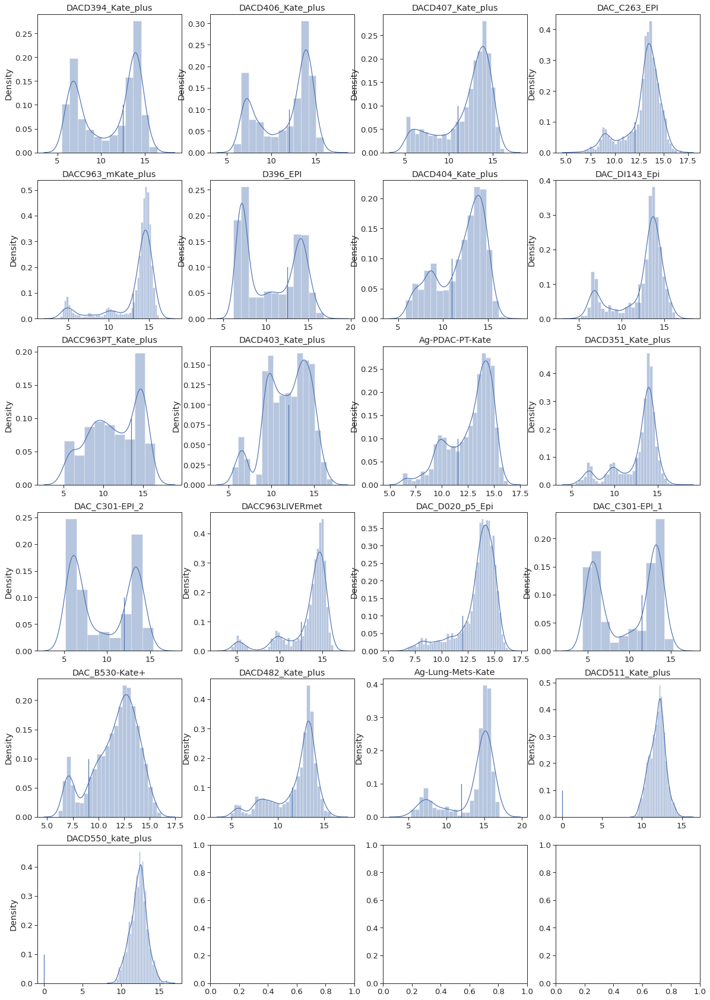

In [23]:
ncol=4
nrow = int(np.ceil(len(set(sc.sample_ids))/ncol))
fig,axes=plt.subplots(nrow,ncol,figsize=(ncol*5,nrow*5))
for i,sample in enumerate(sc.sample_names):
    sns.distplot(np.log2(sc.lib_size[np.where(sc.sample_ids==sample)[0]]+.1),ax=axes.flatten()[i])
    axes.flatten()[i].vlines(cutoffs[i],ymin=0,ymax=.1)
    axes.flatten()[i].set_title(sample)

In [24]:
keep_cells = np.zeros(len(sc.sample_ids))
for i,sample in enumerate(sc.sample_names):
    indices = np.where(sc.sample_ids==sample)[0]
    keep_cells[indices] = np.log2(sc.lib_size[indices]+.1) > cutoffs[i]

In [25]:
np.sum(keep_cells)

32653.0

In [26]:
sc.filter_cells_indices(np.where(keep_cells.astype(np.bool))[0])

In [27]:
sc.data.shape

(32653, 16827)

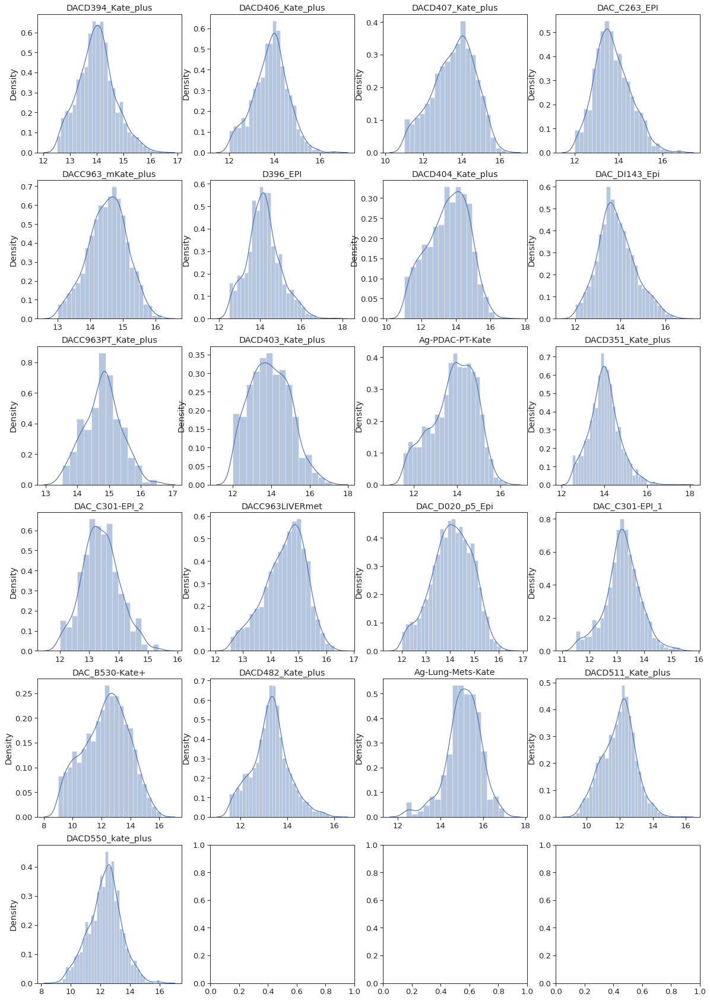

In [28]:
ncol=4
nrow = int(np.ceil(len(set(sc.sample_ids))/ncol))
fig,axes=plt.subplots(nrow,ncol,figsize=(ncol*5,nrow*5))

for i,sample in enumerate(sc.sample_names):
    sns.distplot(np.log2(sc.lib_size[np.where(sc.sample_ids==sample)[0]]+.1),ax=axes.flatten()[i])
    axes.flatten()[i].set_title(sample)

## Additional Cell Filtering

I do one final step where I do a quick visualization of the cells to ensure one final time that there are no low-library size outlier populations in the data. 

We also want to identify potential contaminant mesenchymal (fibroblast/stellate) populations at this stage, which can be easily identified from marker expression. We will remove these later after doublet detection (because these still may potentiall contribute to doublets). 

In [29]:
#prelim embedding to investigate low library size populations
pc = PCA(n_components=30)
pc = pc.fit_transform(np.log2(sc.data_normalized+.1))
tsne_00 = bhtsne.tsne(pc,perplexity=50)

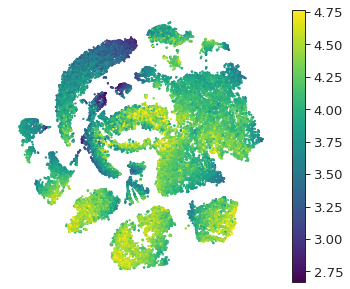

In [30]:
fig,ax=plt.subplots(figsize=(6,5))
color_tSNE(tsne_00,np.log10(sc.lib_size),s=2)

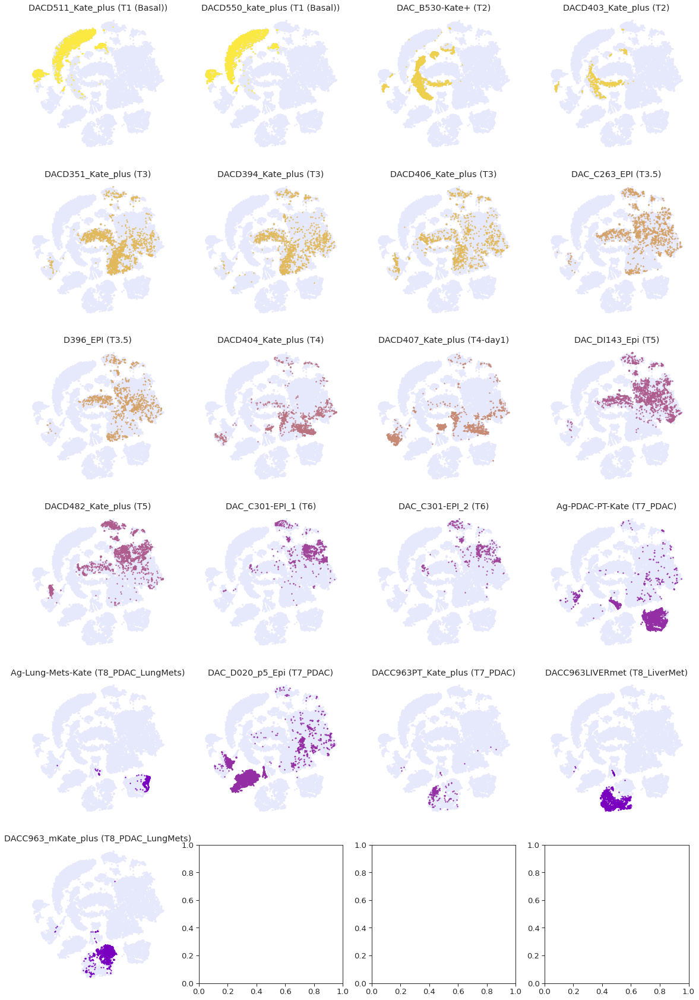

In [31]:
ncol=4
nrow = int(np.ceil(len(set(sc.sample_ids))/ncol))
fig,axes=plt.subplots(nrow,ncol,figsize=(ncol*5,nrow*5))
for i,sample in enumerate(order):
    stage = stage_dict[sample]
    color = color_dict[stage]
    sample_ix = np.where(sc.sample_ids==sample)[0]
    ax = axes.flatten()[i]
    ax.scatter(tsne_00[:,0],tsne_00[:,1],c='#E6E8FB',s=2)
    ax.scatter(tsne_00[:,0][sample_ix],tsne_00[:,1][sample_ix],c=color,s=2)
    ax.set_axis_off()
    ax.set_title("{} ({})".format(sample,stage))

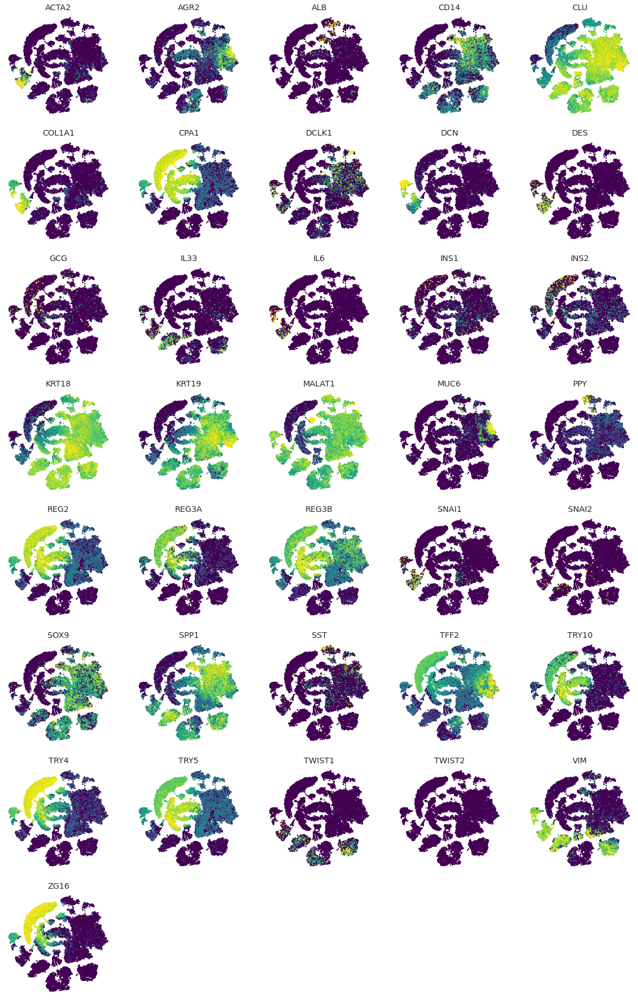

In [32]:
gene_plot(tsne_00, sc.data_normalized, sc.markers,s=2,cmap='viridis')

In [43]:
#prelim, very fine clustering
comms,b,c = phenograph.cluster(pc[:,:20],k=10)

Finding 10 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 2.7437260150909424 seconds
Jaccard graph constructed in 1.0614535808563232 seconds
Wrote graph to binary file in 1.227109670639038 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.934641
After 18 runs, maximum modularity is Q = 0.93567
Louvain completed 38 runs in 12.009705543518066 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 17.55742335319519 seconds


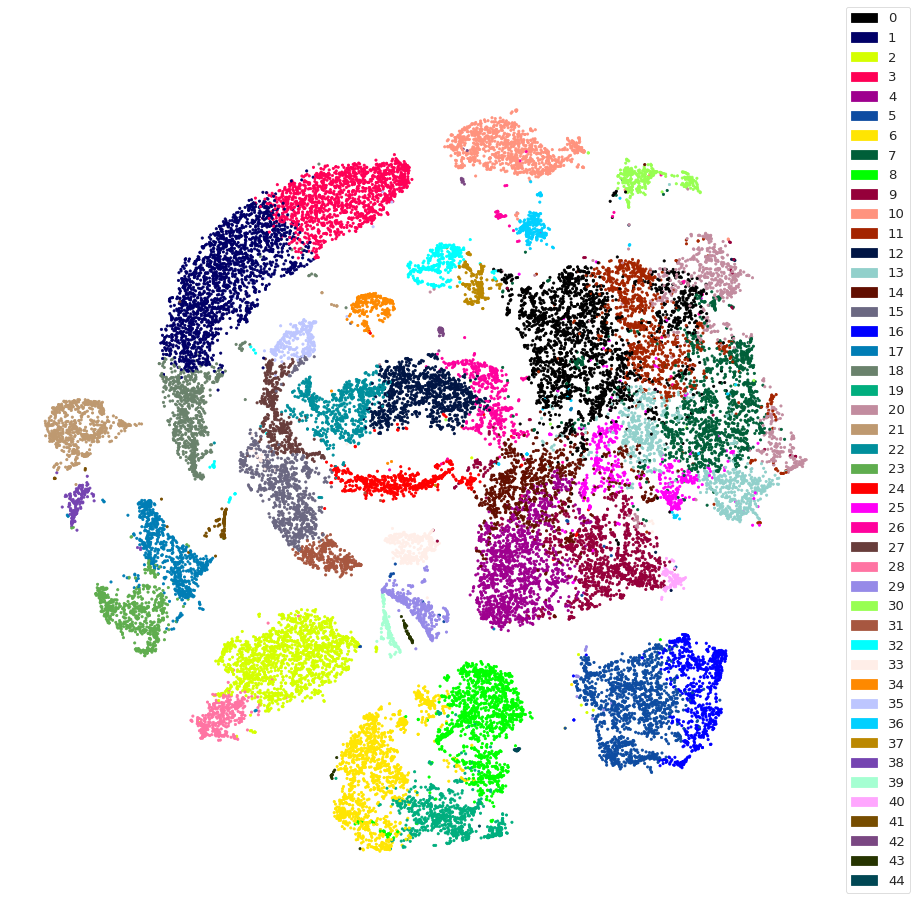

In [44]:
categorical_plot(tsne_00,comms)

In [45]:
boxplot_cols = [sc.palette[i] for i in set(comms)]

<AxesSubplot:xlabel='cluster', ylabel='lib_size'>

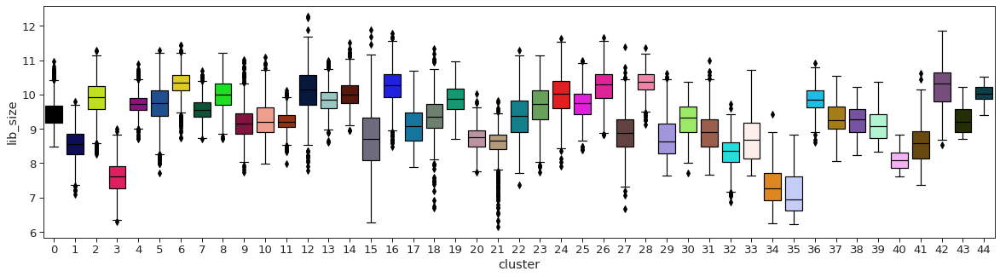

In [46]:
fig,ax=plt.subplots(figsize=(20,5))
tmp_df = pd.DataFrame((comms,np.log(sc.lib_size)),index=['cluster','lib_size']).T
tmp_df.lib_size = tmp_df.lib_size.astype(np.float64)
tmp_df.cluster = tmp_df.cluster.astype(np.int64)

sns.boxplot(data=tmp_df,x='cluster',y='lib_size',palette=boxplot_cols)

In [47]:
filter_clusters_additional = [3,34,35]
filter_cells_clusters_additional = np.array([cell not in filter_clusters_additional for cell in comms])

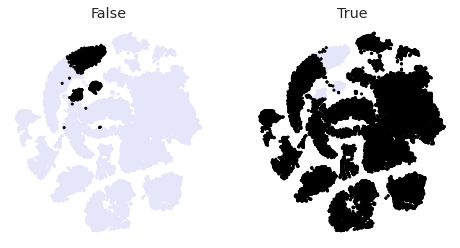

In [48]:
binary_plot(tsne_00,filter_cells_clusters_additional)

In [49]:
sc.filter_cells_indices(np.where(filter_cells_clusters_additional)[0])

In [50]:
sc.data.shape

(30661, 16827)

### Check QC Once More

findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


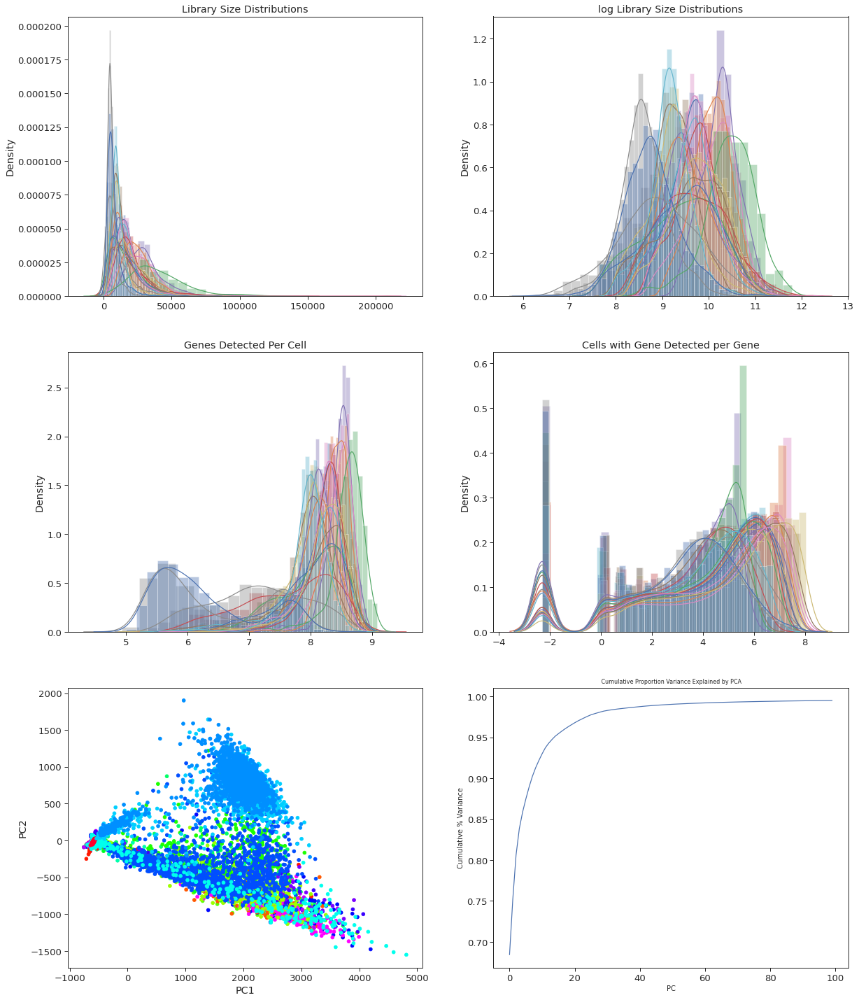

In [51]:
sc.diagnostics()

In [52]:
#save raw data before filtering genes for the analysis
raw_data = sc.data.copy()

## Doublet Detection

I now run doublet detection.

In [53]:
doublets = np.zeros(sc.sample_ids.shape[0])
for sample in set(sc.sample_ids):
    print(sample)
    sample_ix = np.where(sc.sample_ids==sample)[0]
    raw_counts = sc.data.iloc[sample_ix]
    clf = doubletdetection.BoostClassifier()
    clf.phenograph_parameters= {}
    # raw_counts is a cells by genes count matrix
    labels = clf.fit(raw_counts).predict()
    doublets[sample_ix] = deepcopy(labels)

DACD394_Kate_plus


Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.11516380310058594 seconds
Jaccard graph constructed in 0.5009481906890869 seconds
Wrote graph to binary file in 0.592731237411499 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.783644
After 2 runs, maximum modularity is Q = 0.789113
Louvain completed 22 runs in 1.5966882705688477 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 3.3074066638946533 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.13753557205200195 seconds
Jaccard graph constructed in 0.4927091598510742 seconds
Wrote graph to binary file in 0.13223791122436523 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.787139
After 2 runs, maximum modularity is Q = 0.788706
After 4 runs, maximum modularity is Q = 0.790054
After 12 runs, maximum modularity is Q = 0.792509
L

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.1306610107421875 seconds
Jaccard graph constructed in 0.49857568740844727 seconds
Wrote graph to binary file in 0.13452386856079102 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.797149
Louvain completed 21 runs in 1.353330135345459 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 2.622182607650757 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.14054369926452637 seconds
Jaccard graph constructed in 0.5038979053497314 seconds
Wrote graph to binary file in 0.30802106857299805 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.798401
After 2 runs, maximum modularity is Q = 0.799784
Louvain completed 22 runs in 1.5809986591339111 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 3.0343682765960693 secon

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.11695122718811035 seconds
Jaccard graph constructed in 0.4813547134399414 seconds
Wrote graph to binary file in 0.10407376289367676 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.801296
After 3 runs, maximum modularity is Q = 0.803233
Louvain completed 23 runs in 1.5177886486053467 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 2.725792407989502 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.11559486389160156 seconds
Jaccard graph constructed in 0.471630334854126 seconds
Wrote graph to binary file in 0.26676130294799805 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.787135
After 12 runs, maximum modularity is Q = 0.7884
Louvain completed 32 runs in 1.9769251346588135 seconds
Sorting communities by size, please wait ...


Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.16829991340637207 seconds
Jaccard graph constructed in 0.4306025505065918 seconds
Wrote graph to binary file in 0.06891155242919922 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.785055
After 4 runs, maximum modularity is Q = 0.788312
After 18 runs, maximum modularity is Q = 0.789377
Louvain completed 38 runs in 2.1899826526641846 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 3.361940622329712 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.17880797386169434 seconds
Jaccard graph constructed in 0.4295539855957031 seconds
Wrote graph to binary file in 0.06590890884399414 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.790386
After 2 runs, maximum modularity is Q = 0.793874
Louvain completed 22 runs in 1.3732526302337646 s

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.16855168342590332 seconds
Jaccard graph constructed in 0.3914809226989746 seconds
Wrote graph to binary file in 0.027684926986694336 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.412027
After 2 runs, maximum modularity is Q = 0.420121
After 4 runs, maximum modularity is Q = 0.425839
Louvain completed 24 runs in 1.4621529579162598 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 2.5532515048980713 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.17371916770935059 seconds
Jaccard graph constructed in 0.39456987380981445 seconds
Wrote graph to binary file in 0.02749776840209961 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.416454
After 5 runs, maximum modularity is Q = 0.41746
Louvain completed 25 runs in 1.361891508102417 s

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.16919636726379395 seconds
Jaccard graph constructed in 0.4073028564453125 seconds
Wrote graph to binary file in 0.04817533493041992 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.694878
After 13 runs, maximum modularity is Q = 0.696765
Louvain completed 33 runs in 1.724259853363037 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 2.8528270721435547 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.16773462295532227 seconds
Jaccard graph constructed in 0.4100992679595947 seconds
Wrote graph to binary file in 0.04692268371582031 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.696804
After 5 runs, maximum modularity is Q = 0.698709
Louvain completed 25 runs in 1.3867120742797852 seconds
Sorting communities by size, please wait .

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.2252185344696045 seconds
Jaccard graph constructed in 0.5337574481964111 seconds
Wrote graph to binary file in 0.3352184295654297 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.739844
After 2 runs, maximum modularity is Q = 0.742253
After 5 runs, maximum modularity is Q = 0.744557
After 10 runs, maximum modularity is Q = 0.746302
Louvain completed 30 runs in 2.6524784564971924 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 4.257416248321533 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.2082507610321045 seconds
Jaccard graph constructed in 0.5384886264801025 seconds
Wrote graph to binary file in 0.3063979148864746 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.74953
After 21 runs, maximum modularity is Q = 0.750771
Louv

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.12267804145812988 seconds
Jaccard graph constructed in 0.6142551898956299 seconds
Wrote graph to binary file in 0.304210901260376 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.82369
After 15 runs, maximum modularity is Q = 0.825229
Louvain completed 35 runs in 2.5155818462371826 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 4.076893091201782 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.11129117012023926 seconds
Jaccard graph constructed in 0.5503394603729248 seconds
Wrote graph to binary file in 0.3228602409362793 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.820074
After 2 runs, maximum modularity is Q = 0.821353
Louvain completed 22 runs in 1.8898169994354248 seconds
Sorting communities by size, please wait ...
P

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.22082924842834473 seconds
Jaccard graph constructed in 0.5439410209655762 seconds
Wrote graph to binary file in 0.3362712860107422 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.840053
After 11 runs, maximum modularity is Q = 0.841505
Louvain completed 31 runs in 2.4521493911743164 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 4.075894594192505 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.2140061855316162 seconds
Jaccard graph constructed in 0.5550582408905029 seconds
Wrote graph to binary file in 0.31934618949890137 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.839891
Louvain completed 21 runs in 1.5220551490783691 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 3.140533208847046 second

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.14275598526000977 seconds
Jaccard graph constructed in 0.6969964504241943 seconds
Wrote graph to binary file in 0.10747194290161133 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.805116
After 3 runs, maximum modularity is Q = 0.808748
Louvain completed 23 runs in 1.605196237564087 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 3.0645885467529297 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.14655399322509766 seconds
Jaccard graph constructed in 0.5039722919464111 seconds
Wrote graph to binary file in 0.2613394260406494 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.806322
After 15 runs, maximum modularity is Q = 0.808542
Louvain completed 35 runs in 2.279972791671753 seconds
Sorting communities by size, please wait ...

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.1308579444885254 seconds
Jaccard graph constructed in 0.5220117568969727 seconds
Wrote graph to binary file in 0.3176600933074951 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.8058
After 3 runs, maximum modularity is Q = 0.806832
Louvain completed 23 runs in 1.7192659378051758 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 3.2081539630889893 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.13071274757385254 seconds
Jaccard graph constructed in 0.5148208141326904 seconds
Wrote graph to binary file in 0.29107117652893066 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.801496
After 7 runs, maximum modularity is Q = 0.803244
After 17 runs, maximum modularity is Q = 0.804328
Louvain completed 37 runs in 2.6821703910827637 seco

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.13273835182189941 seconds
Jaccard graph constructed in 0.5094873905181885 seconds
Wrote graph to binary file in 0.30933141708374023 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.737198
After 3 runs, maximum modularity is Q = 0.738675
After 4 runs, maximum modularity is Q = 0.740665
Louvain completed 24 runs in 1.9544222354888916 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 3.4171366691589355 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.12677955627441406 seconds
Jaccard graph constructed in 0.511831521987915 seconds
Wrote graph to binary file in 0.13207435607910156 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.73912
After 5 runs, maximum modularity is Q = 0.743465
Louvain completed 25 runs in 1.8815357685089111 sec

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.1737210750579834 seconds
Jaccard graph constructed in 0.40053606033325195 seconds
Wrote graph to binary file in 0.0325620174407959 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.532895
After 6 runs, maximum modularity is Q = 0.536674
After 13 runs, maximum modularity is Q = 0.539831
Louvain completed 33 runs in 1.8884761333465576 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 3.004796028137207 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.16667413711547852 seconds
Jaccard graph constructed in 0.4011259078979492 seconds
Wrote graph to binary file in 0.1786971092224121 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.557772
After 10 runs, maximum modularity is Q = 0.55955
Louvain completed 30 runs in 1.5997037887573242 sec

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.15917396545410156 seconds
Jaccard graph constructed in 0.46723198890686035 seconds
Wrote graph to binary file in 0.10052180290222168 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.774267
Louvain completed 21 runs in 1.2842216491699219 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 2.540212869644165 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.1502230167388916 seconds
Jaccard graph constructed in 0.4691605567932129 seconds
Wrote graph to binary file in 0.2745976448059082 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.771241
Louvain completed 21 runs in 1.2564420700073242 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 2.6646511554718018 seconds
Finding 30 nearest neighbors using minkowski m

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.11666631698608398 seconds
Jaccard graph constructed in 0.5267655849456787 seconds
Wrote graph to binary file in 0.33861374855041504 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.783948
After 8 runs, maximum modularity is Q = 0.785547
Louvain completed 28 runs in 2.2076547145843506 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 3.7035603523254395 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.12661981582641602 seconds
Jaccard graph constructed in 0.5407528877258301 seconds
Wrote graph to binary file in 0.3161611557006836 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.780918
After 2 runs, maximum modularity is Q = 0.782138
After 16 runs, maximum modularity is Q = 0.784497
Louvain completed 36 runs in 2.8556556701660156 s

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.21022295951843262 seconds
Jaccard graph constructed in 0.5883848667144775 seconds
Wrote graph to binary file in 0.3801593780517578 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.796472
After 3 runs, maximum modularity is Q = 0.798191
After 5 runs, maximum modularity is Q = 0.801048
Louvain completed 25 runs in 2.5250988006591797 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 4.228280305862427 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.21022701263427734 seconds
Jaccard graph constructed in 0.6036908626556396 seconds
Wrote graph to binary file in 0.502213716506958 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.803149
Louvain completed 21 runs in 1.8199572563171387 seconds
Sorting communities by size, please wait ...
P

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.21207857131958008 seconds
Jaccard graph constructed in 0.557039737701416 seconds
Wrote graph to binary file in 0.3316974639892578 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.798001
After 2 runs, maximum modularity is Q = 0.800341
After 4 runs, maximum modularity is Q = 0.801361
After 6 runs, maximum modularity is Q = 0.802451
Louvain completed 26 runs in 2.6216063499450684 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 4.249726057052612 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.21236205101013184 seconds
Jaccard graph constructed in 0.6146674156188965 seconds
Wrote graph to binary file in 0.31412672996520996 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.79982
After 3 runs, maximum modularity is Q = 0.800946
Louv

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.12930679321289062 seconds
Jaccard graph constructed in 0.5172348022460938 seconds
Wrote graph to binary file in 0.334514856338501 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.8123
After 5 runs, maximum modularity is Q = 0.813357
After 19 runs, maximum modularity is Q = 0.814735
Louvain completed 39 runs in 2.8880491256713867 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 4.387601852416992 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.12838435173034668 seconds
Jaccard graph constructed in 0.5367474555969238 seconds
Wrote graph to binary file in 0.3132822513580322 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.802554
After 2 runs, maximum modularity is Q = 0.805606
Louvain completed 22 runs in 1.7768816947937012 second

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.3099203109741211 seconds
Jaccard graph constructed in 0.6488401889801025 seconds
Wrote graph to binary file in 0.43222737312316895 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.79926
After 2 runs, maximum modularity is Q = 0.803714
Louvain completed 22 runs in 2.423922300338745 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 4.345184087753296 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.31037068367004395 seconds
Jaccard graph constructed in 0.658663272857666 seconds
Wrote graph to binary file in 0.5469284057617188 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.807599
After 17 runs, maximum modularity is Q = 0.808601
After 20 runs, maximum modularity is Q = 0.809952
Louvain completed 40 runs in 4.399171352386475 second

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.1701953411102295 seconds
Jaccard graph constructed in 0.5168964862823486 seconds
Wrote graph to binary file in 0.08459615707397461 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.701322
After 2 runs, maximum modularity is Q = 0.7027
After 4 runs, maximum modularity is Q = 0.70479
After 12 runs, maximum modularity is Q = 0.706819
Louvain completed 32 runs in 2.2916691303253174 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 3.5884156227111816 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.16929984092712402 seconds
Jaccard graph constructed in 0.46277713775634766 seconds
Wrote graph to binary file in 0.10414290428161621 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.687838
After 2 runs, maximum modularity is Q = 0.699128
Af

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.1105506420135498 seconds
Jaccard graph constructed in 0.5857975482940674 seconds
Wrote graph to binary file in 0.4078059196472168 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.797341
After 7 runs, maximum modularity is Q = 0.798664
After 18 runs, maximum modularity is Q = 0.800145
Louvain completed 38 runs in 3.2121355533599854 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 4.839236736297607 seconds
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.21082067489624023 seconds
Jaccard graph constructed in 0.6207101345062256 seconds
Wrote graph to binary file in 0.34152650833129883 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.796549
After 3 runs, maximum modularity is Q = 0.799353
Louvain completed 23 runs in 1.9664053916931152 sec

In [54]:
pc = PCA(n_components=50)
pc = pc.fit_transform(np.log2(sc.data_normalized+.1))
tsne_01 = bhtsne.tsne(pc,perplexity=50)

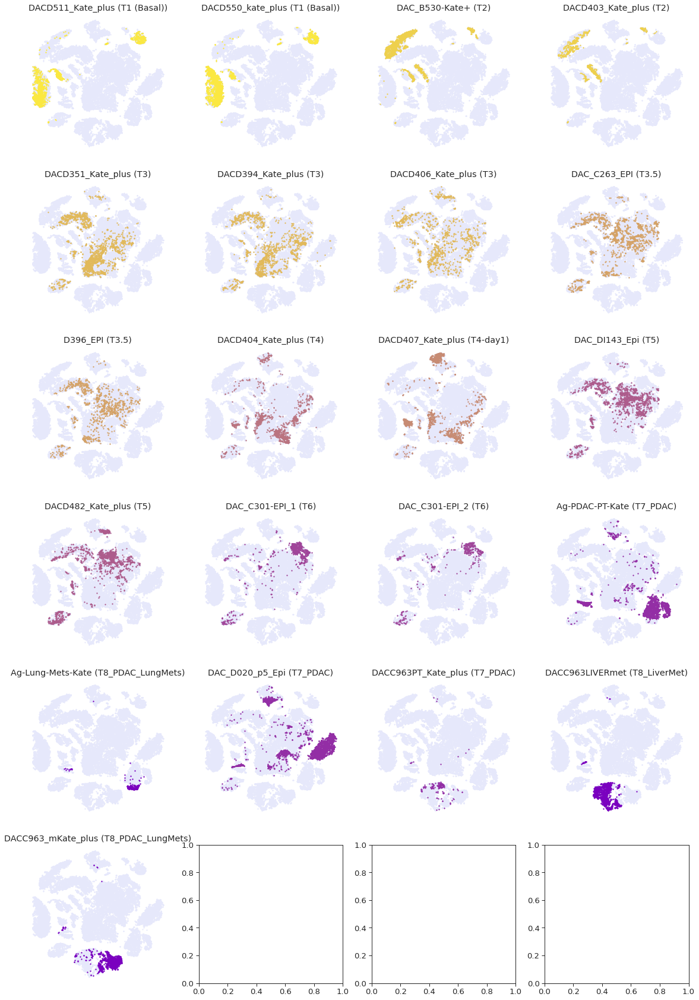

In [55]:
ncol=4
nrow = int(np.ceil(len(set(sc.sample_ids))/ncol))
fig,axes=plt.subplots(nrow,ncol,figsize=(ncol*5,nrow*5))
for i,sample in enumerate(order):
    stage = stage_dict[sample]
    color = color_dict[stage]
    sample_ix = np.where(sc.sample_ids==sample)[0]
    ax = axes.flatten()[i]
    ax.scatter(tsne_01[:,0],tsne_01[:,1],c='#E6E8FB',s=2)
    ax.scatter(tsne_01[:,0][sample_ix],tsne_01[:,1][sample_ix],c=color,s=2)
    ax.set_axis_off()
    ax.set_title("{} ({})".format(sample,stage))

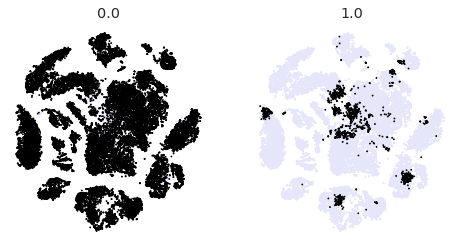

In [56]:
binary_plot(tsne_01,doublets,s=1)

In [57]:
#prelim, very fine clustering
comms,b,c = phenograph.cluster(pc,k=50)

Finding 50 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 6.189676761627197 seconds
Jaccard graph constructed in 5.346654415130615 seconds
Wrote graph to binary file in 5.8349034786224365 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.913795
Louvain completed 21 runs in 37.45047116279602 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 55.54822778701782 seconds


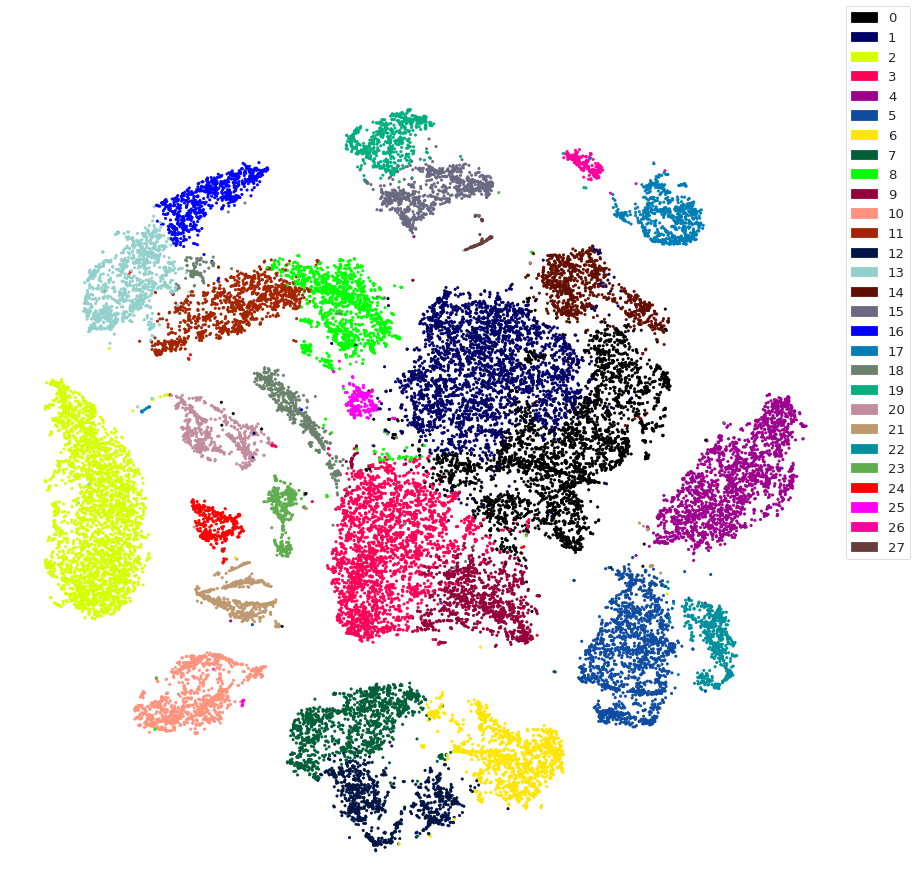

In [58]:
categorical_plot(tsne_01,comms)

In [59]:
doublet_props = np.zeros(len(set(comms)))
for comm in set(comms):
    comm_ix = np.where(comms==comm)[0]
    prop = np.sum(doublets[comm_ix])/len(comm_ix)
    doublet_props[comm] = np.sum(doublets[comm_ix])/len(comm_ix)
    print(comm,prop)

0 0.025380710659898477
1 0.1145374449339207
2 0.05649514213745952
3 0.059397884458909686
4 0.009244992295839754
5 0.1268939393939394
6 0.007413509060955519
7 0.08900083963056256
8 0.21635434412265758
9 0.0009442870632672333
10 0.0019175455417066154
11 0.0
12 0.003080082135523614
13 0.0
14 0.039125431530494824
15 0.004987531172069825
16 0.0
17 0.09090909090909091
18 0.012326656394453005
19 0.004909983633387889
20 0.0
21 0.0
22 0.0
23 0.0
24 0.0
25 0.5233644859813084
26 0.0
27 0.06666666666666667


In [60]:
boxplot_cols = [sc.palette[i] for i in set(comms)]

<BarContainer object of 28 artists>

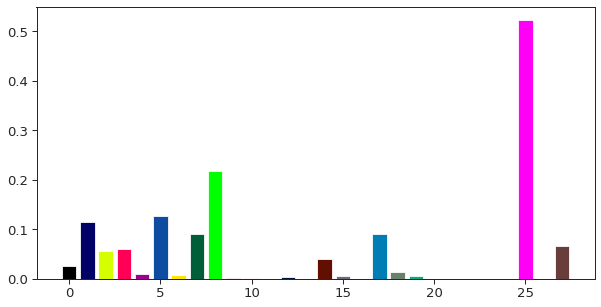

In [61]:
fig,ax=plt.subplots(figsize=(10,5))
plt.bar(range(len(doublet_props)),doublet_props,color=boxplot_cols)

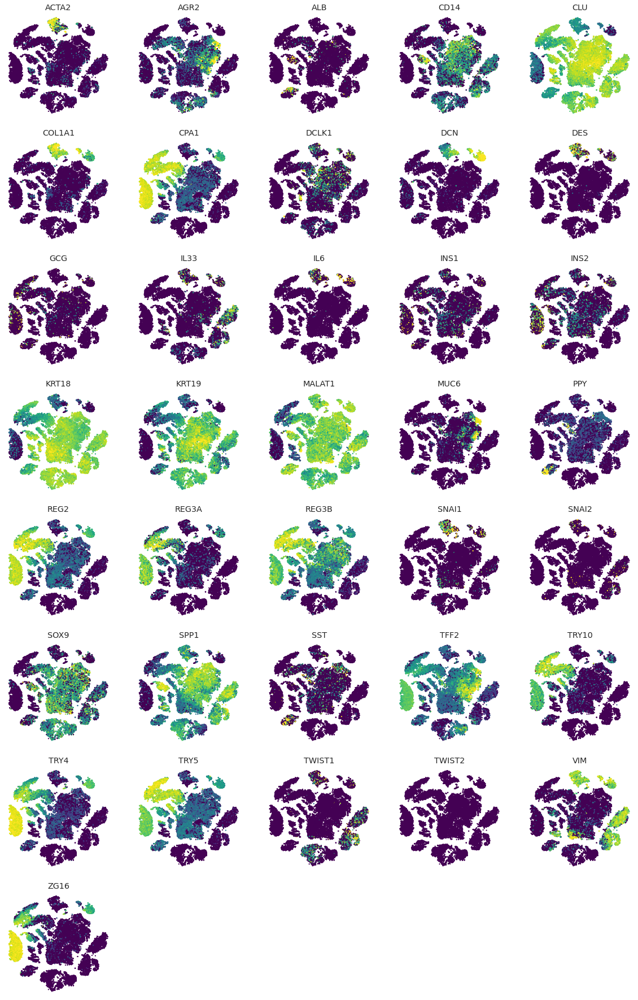

In [62]:
gene_plot(tsne_01, sc.data_normalized, sc.markers,s=2,cmap='viridis')

<AxesSubplot:xlabel='cluster', ylabel='LUM'>

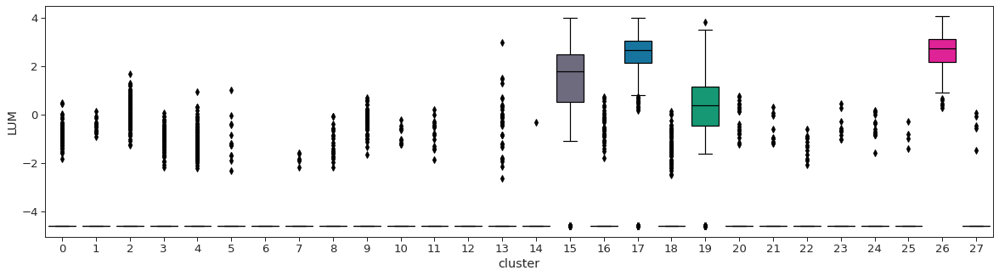

In [63]:
fig,ax=plt.subplots(figsize=(20,5))
tmp_df = pd.DataFrame((comms,np.log(sc.data_normalized['LUM']+.01)),index=['cluster','LUM']).T
tmp_df['LUM'] = tmp_df['LUM'].astype(np.float64)
tmp_df.cluster = tmp_df.cluster.astype(np.int64)

sns.boxplot(data=tmp_df,x='cluster',y='LUM',palette=boxplot_cols)

<AxesSubplot:xlabel='cluster', ylabel='ACTA2'>

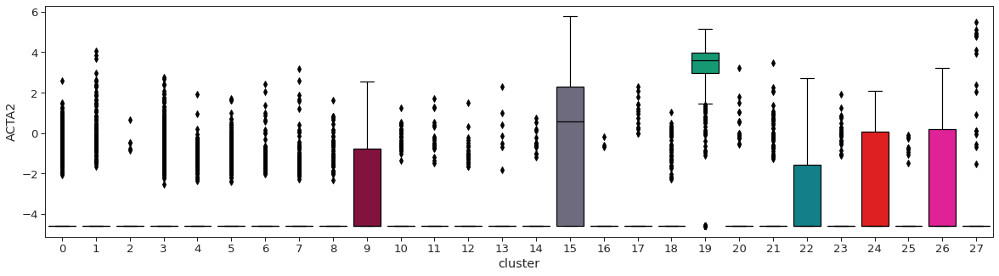

In [64]:
fig,ax=plt.subplots(figsize=(20,5))
tmp_df = pd.DataFrame((comms,np.log(sc.data_normalized['ACTA2']+.01)),index=['cluster','ACTA2']).T
tmp_df['ACTA2'] = tmp_df['ACTA2'].astype(np.float64)
tmp_df.cluster = tmp_df.cluster.astype(np.int64)

sns.boxplot(data=tmp_df,x='cluster',y='ACTA2',palette=boxplot_cols)

<AxesSubplot:xlabel='cluster', ylabel='COL1A1'>

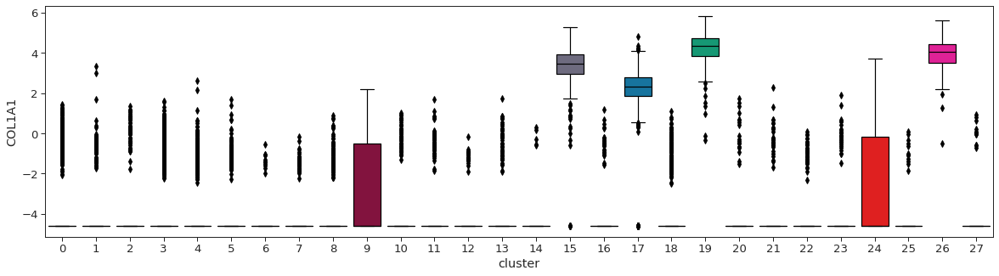

In [65]:
fig,ax=plt.subplots(figsize=(20,5))
tmp_df = pd.DataFrame((comms,np.log(sc.data_normalized['COL1A1']+.01)),index=['cluster','COL1A1']).T
tmp_df['COL1A1'] = tmp_df['COL1A1'].astype(np.float64)
tmp_df.cluster = tmp_df.cluster.astype(np.int64)

sns.boxplot(data=tmp_df,x='cluster',y='COL1A1',palette=boxplot_cols)

In [67]:
cont_clusters_additional = [15,17,19,26]
cont_cells_clusters_additional = np.array([cell not in cont_clusters_additional for cell in comms])

In [68]:
np.sum(~cont_cells_clusters_additional)

2316

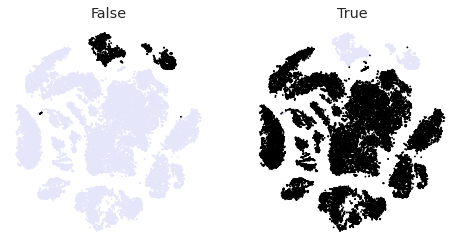

In [69]:
binary_plot(tsne_01,cont_cells_clusters_additional,s=1)

In [70]:
doublet_clusters_additional = [25]
doublet_cells_clusters_additional = np.array([cell not in doublet_clusters_additional for cell in comms])

In [71]:
np.sum(~doublet_cells_clusters_additional)

214

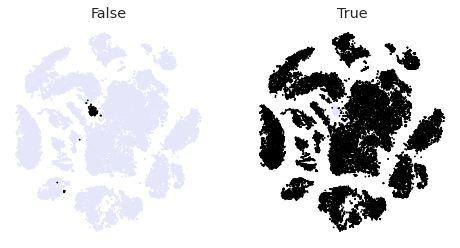

In [72]:
binary_plot(tsne_01,doublet_cells_clusters_additional,s=1)

In [73]:
new_cell_ids = np.array([cell not in cont_clusters_additional+doublet_clusters_additional for cell in comms])

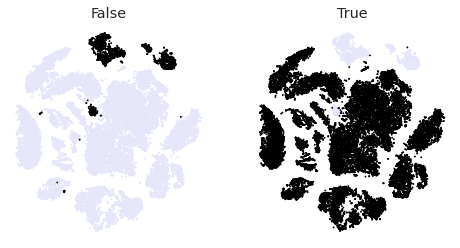

In [74]:
binary_plot(tsne_01,new_cell_ids,s=1)

In [75]:
sc.filter_cells_indices(np.where(new_cell_ids)[0])

In [76]:
sc.cell_sample_ids = ["{}_{}".format(sc.cell_ids[i],sc.sample_ids[i]) for i in range(len(sc.sample_ids))]

In [77]:
pd.DataFrame((doublets,sc.cell_sample_ids)).T.to_csv("FullProgression-March2021_NewFilt-OrigGenes-v3_doublets.csv")

In [78]:
sc.data.drop_duplicates().shape

(28131, 16827)

In [79]:
sc.data.shape

(28131, 16827)

## Additional Gene Filtering

In [80]:
pca = PCA(n_components=5)
pc = pca.fit_transform(sc.data_normalized.T)

In [81]:
print(", ".join(sc.genes[np.argsort(pc[:,0])[::-1][:20]]))
print(", ".join(sc.genes[np.argsort(pc[:,1])[::-1][:20]]))
print(", ".join(sc.genes[np.argsort(pc[:,2])[::-1][:20]]))
print(", ".join(sc.genes[np.argsort(pc[:,3])[::-1][:20]]))
print(", ".join(sc.genes[np.argsort(pc[:,4])[::-1][:20]]))

CTRB1, PRSS2, CLPS, REG1, TRY4, TRY5, CELA1, PNLIPRP1, CELA3B, REG2, 2210010C04RIK, CPA1, REG3B, CPB1, PNLIP, CTRL, RNASE1, ZG16, CLU, CEL
CLU, MALAT1, S100A6, SPP1, TMSB4X, EEF1A1, TPT1, TRY5, GM11808, KRT18, ACTG1, S100A11, CTRB1, KRT8, GHRL, TMSB10, REG3B, FTL1, FAU, TFF2
TRY4, CLPS, CELA1, CLU, MALAT1, CELA3B, 2210010C04RIK, PNLIP, S100A6, CTRL, SPP1, ZG16, TFF2, RNASE1, CPB1, TMSB4X, GHRL, TPT1, GM11808, EEF1A1
GHRL, PYY, PPY, CTRB1, TTR, CHGA, RBP4, AMBP, PCSK1N, SST, RESP18, CST3, MALAT1, TM4SF4, GKN3, CTSL, UBB, CHGB, MAGED2, ITM2B
PPY, PYY, MALAT1, SST, PCSK1N, CHGB, GAST, GCG, RESP18, RBP4, CTRB1, IAPP, CCK, CHGA, GIP, UBB, INS2, INS1, JUND, BTG2


In [82]:
#repeat on logged data
pca = PCA(n_components=5)
pc = pca.fit_transform(np.log2(sc.data_normalized+.1).T)

In [83]:
print(", ".join(sc.genes[np.argsort(pc[:,0])[::-1][:20]]))
print(", ".join(sc.genes[np.argsort(pc[:,1])[::-1][:20]]))
print(", ".join(sc.genes[np.argsort(pc[:,2])[::-1][:20]]))
print(", ".join(sc.genes[np.argsort(pc[:,3])[::-1][:20]]))
print(", ".join(sc.genes[np.argsort(pc[:,4])[::-1][:20]]))

CLU, MALAT1, EEF1A1, TPT1, TMSB4X, GM11808, S100A6, KRT18, FAU, ACTG1, FTL1, KRT8, S100A11, UBB, PPIA, FTH1, ACTB, TMSB10, EIF1, PTMA
CTRB1, REG1, PRSS2, CLPS, TRY5, PNLIPRP1, TRY4, REG2, CPA1, CELA3B, REG3B, CPB1, 2210010C04RIK, CELA1, RNASE1, CTRL, SYCN, CEL, CPA2, SPINK1
LGALS1, FN1, CPE, IGFBP4, VIM, TUBA1A, MSN, CLDN6, FBLN2, TRY4, FXYD5, HMGA2, CNN3, SPINK1, CTRL, RNASE1, TIMP1, PLIN2, CELA3B, GM9844
CLDN4, CYR61, JUN, GHRL, KLF6, CDKN1A, SFN, DUSP1, BTG2, GADD45A, CTRB1, MALAT1, EGR1, ATF3, 1810011O10RIK, PYY, RHOB, HBEGF, IER3, REG1
TFF2, AREG, S100A14, DMBT1, EMP1, SFN, TFF1, TRY4, ANXA1, LY6A, PRSS22, CELA3B, LAMC2, CTRL, PNLIP, PHLDA1, ZG16, 2210010C04RIK, CPB1, CELA1


In [84]:
print(", ".join(sc.genes[np.argsort(pc[:,0])[::-1][:200]]))

CLU, MALAT1, EEF1A1, TPT1, TMSB4X, GM11808, S100A6, KRT18, FAU, ACTG1, FTL1, KRT8, S100A11, UBB, PPIA, FTH1, ACTB, TMSB10, EIF1, PTMA, HSP90AB1, H3F3B, SPP1, HSPA8, PRDX1, COX4I1, RACK1, PFN1, GAPDH, EEF2, WDR89, LY6E, MYL6, NACA, CHCHD2, COX8A, COX7C, CALM1, SERF2, KRT19, SPINT2, YBX1, EEF1G, CFL1, JUND, TAGLN2, EEF1B2, BTF3, S100A10, GNG5, ANXA2, GM10076, COX6C, GM9843, ITM2B, H3F3A, OAZ1, CYSTM1, DSTN, TXN1, UBC, ATP5L, JUNB, CD63, COX6B1, GM2000, EPCAM, MYL12A, UQCRH, GPX4, BSG, ATP5E, CD24A, HSP90AA1, GNAS, EIF5A, SEC61G, NUPR1, ATP5B, DYNLL1, NPM1, CTRB1, FOS, ATPIF1, CTSL, TCEB2, EIF4A1, ATP5J2, KRT7, EIF3F, GM9493, ATP5H, CLIC1, PFDN5, CD9, ATP5J, EIF3H, MT1, COX6A1, GM10073, NDUFA4, ATP5G2, COX7A2L, SHFM1, IFITM2, SH3BGRL3, HINT1, TSPO, ALDOA, CALM2, GABARAP, CD81, ARPC1B, NDUFA2, PABPC1, REG1, TNFRSF12A, UQCRB, COX7A2, DBI, AKR1A1, SEC61B, SLC25A3, CSTB, PPIB, CALR, GPX1, NDUFA13, COX5B, B2M, FXYD3, LGALS1, CRIP1, UQCR11, RBM39, IER2, NDUFA7, PRDX2, ATP5D, 2010107E04RIK, ANXA

In [85]:
print(", ".join(sc.genes[np.argsort(pc[:,0])[::-1][:500]]))

CLU, MALAT1, EEF1A1, TPT1, TMSB4X, GM11808, S100A6, KRT18, FAU, ACTG1, FTL1, KRT8, S100A11, UBB, PPIA, FTH1, ACTB, TMSB10, EIF1, PTMA, HSP90AB1, H3F3B, SPP1, HSPA8, PRDX1, COX4I1, RACK1, PFN1, GAPDH, EEF2, WDR89, LY6E, MYL6, NACA, CHCHD2, COX8A, COX7C, CALM1, SERF2, KRT19, SPINT2, YBX1, EEF1G, CFL1, JUND, TAGLN2, EEF1B2, BTF3, S100A10, GNG5, ANXA2, GM10076, COX6C, GM9843, ITM2B, H3F3A, OAZ1, CYSTM1, DSTN, TXN1, UBC, ATP5L, JUNB, CD63, COX6B1, GM2000, EPCAM, MYL12A, UQCRH, GPX4, BSG, ATP5E, CD24A, HSP90AA1, GNAS, EIF5A, SEC61G, NUPR1, ATP5B, DYNLL1, NPM1, CTRB1, FOS, ATPIF1, CTSL, TCEB2, EIF4A1, ATP5J2, KRT7, EIF3F, GM9493, ATP5H, CLIC1, PFDN5, CD9, ATP5J, EIF3H, MT1, COX6A1, GM10073, NDUFA4, ATP5G2, COX7A2L, SHFM1, IFITM2, SH3BGRL3, HINT1, TSPO, ALDOA, CALM2, GABARAP, CD81, ARPC1B, NDUFA2, PABPC1, REG1, TNFRSF12A, UQCRB, COX7A2, DBI, AKR1A1, SEC61B, SLC25A3, CSTB, PPIB, CALR, GPX1, NDUFA13, COX5B, B2M, FXYD3, LGALS1, CRIP1, UQCR11, RBM39, IER2, NDUFA7, PRDX2, ATP5D, 2010107E04RIK, ANXA

After inspecting these genes, I only remove those which are not biologically important in this system. This almost always includes MALAT1!

In [86]:
#save MALAT1 to check expression later
malat1 = sc.data_normalized['MALAT1']
sc.filter_genes_indices(np.where(sc.genes!='MALAT1')[0])

## Highly Variable Gene Selection

Next I look for highly variable genes. I do not do this initially for every dataset, but sometimes it really helps bring out the structure. I use the method developed by Aviv Regev, which looks at the relationship between mean expression and coefficient of variation (estimated with lowess regression) to find highly variable genes.

In [87]:
import statsmodels.api as statsmodels

In [88]:
mean = sc.data_normalized.mean(0)
std = sc.data_normalized.std(0)
output = statsmodels.nonparametric.lowess(np.log(std**2/mean+.1).values,
                                                           np.log(mean+.1).values,
                                                          return_sorted=False)
residuals = output - np.log(std**2/mean+.1)

The plot below shows log of standard deviation vs. log of mean expression. The trend estimated with lowess regression is shown in orange.

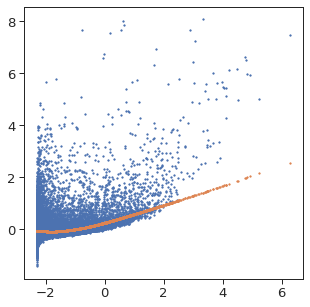

In [89]:
fig,ax=plt.subplots(figsize=(5,5))
plt.scatter(np.log(mean+.1),np.log(std**2/mean+.1),s=2)
plt.scatter(np.log(mean+.1),output,s=2)

In [90]:
residuals = output - np.log(std**2/mean+.1)

We then select genes which are highly variable as indicated by high residuals from this trend. In particular, we use a sliding window along mean expression, choosing the genes with top residuals in each window, in order to ensure we don't enrich for highly expressed genes.

In [91]:
nwindows = 41
step = int(np.ceil(len(mean)/nwindows))
keep = []
for i in range(nwindows-1):
    start = (i+1)*step
    stop = (i+2)*step
    genes_ = np.argsort(mean.values)[start:stop]
    genes_resids = residuals[genes_]
    keep.append(genes_[np.argsort(genes_resids)[:200]])
keep = np.hstack(keep)

The genes which pass this filter are in orange below:

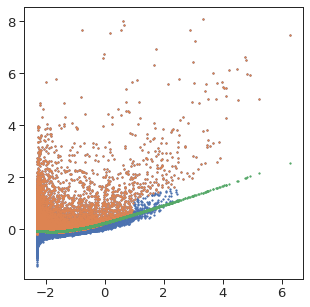

In [92]:
fig,ax=plt.subplots(figsize=(5,5))
plt.scatter(np.log(mean+.1),np.log(std**2/mean+.1),s=2)
plt.scatter(np.log(mean+.1)[keep],np.log(std**2/mean+.1)[keep],s=2)

plt.scatter(np.log(mean+.1),output,s=2)

In [93]:
len(set(keep))

8000

In [94]:
#save other genes in case we need their expression later
not_keep = list(set(range(sc.data.shape[1]))-set(keep))
data_discarded_genes = sc.data_normalized[np.array(list(sc.data_normalized))[not_keep]]

sc.filter_genes_indices(keep)

## Dimensionality Reduction, Visualization, and Clustering

This is all mostly for exploratory analysis. This will help me make final decisions later on in the more in-depth analysis.

### PCA

First I run PCA and automatically determine the knee point in the distribution. For logged data, this usually doesn't explain much of the variance, so in practice I may have to take further PCs (but in practice I usually don't end up using logged data anyways so this doesn't really matter for me). 

PCA on Log-Transformed, Normalized Counts:
# PCs: 12
% Variance Explained: 0.3583398574478783
 
PCA on Normalized (un-transformed) Counts:
# PCs: 17
% Variance Explained: 0.9691677714474803


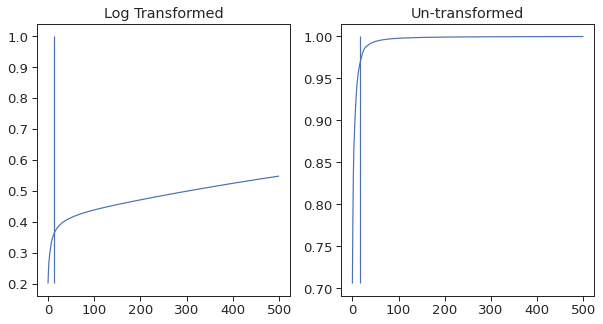

In [95]:
sc.pca(npca=500)

In [96]:
def kneepoint(vec):
    curve =  [1-x for x in vec]
    nPoints = len(curve)
    allCoord = np.vstack((range(nPoints), curve)).T
    np.array([range(nPoints), curve])
    firstPoint = allCoord[0]
    lineVec = allCoord[-1] - allCoord[0]
    lineVecNorm = lineVec / np.sqrt(np.sum(lineVec**2))
    vecFromFirst = allCoord - firstPoint
    scalarProduct = np.sum(vecFromFirst * np.tile(lineVecNorm, (nPoints, 1)), axis=1)
    vecFromFirstParallel = np.outer(scalarProduct, lineVecNorm)
    vecToLine = vecFromFirst - vecFromFirstParallel
    distToLine = np.sqrt(np.sum(vecToLine ** 2, axis=1))
    idxOfBestPoint = np.argmax(distToLine)
    return idxOfBestPoint

In [97]:
cms = np.cumsum(sc.pc_log_explained_var)
knee = kneepoint(cms)
print(knee)
print("Variance explained: ",cms[knee])

49
Variance explained:  0.41299935500476714


Text(0.5, 1.0, 'Log Transformed')

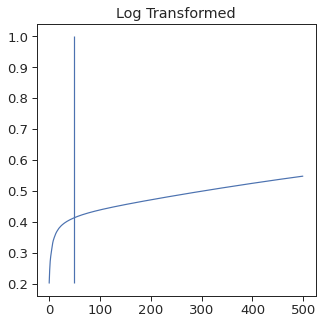

In [98]:
#manually adjust
fig,axes = plt.subplots(figsize=(5,5))

axes.plot(np.cumsum(sc.pc_log_explained_var))
axes.vlines(knee,ymin=sc.pc_log_explained_var[0],ymax=1)
axes.set_title("Log Transformed")

In [99]:
sc.npca_log = knee

### Diffusion Maps

Then I run diffusion maps and choose the number of DCs based on eigengap.

In [100]:
sc.diffusionmaps_palantir()

Determing nearest neighbor graph...
# DCs based on Eigen gap: 13


## Visualization on PCs/DCs


In [101]:
sc.tSNE(perplexity=150,theta=.5)

Performing tSNE on PCs...


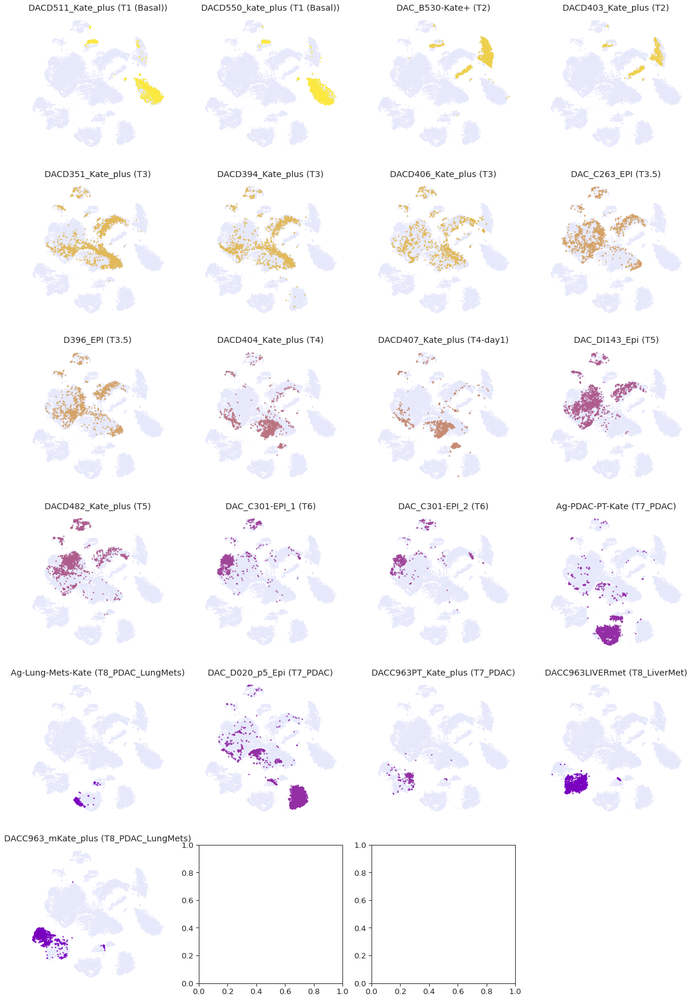

In [102]:
ncol=4
nrow = int(np.ceil(len(set(sc.sample_ids))/ncol))
fig,axes=plt.subplots(nrow,ncol,figsize=(ncol*5,nrow*5))
for i,sample in enumerate(order):
    stage = stage_dict[sample]
    color = color_dict[stage]
    sample_ix = np.where(sc.sample_ids==sample)[0]
    ax = axes.flatten()[i]
    ax.scatter(sc.tsne_log[:,0],sc.tsne_log[:,1],c='#E6E8FB',s=.5)
    ax.scatter(sc.tsne_log[:,0][sample_ix],sc.tsne_log[:,1][sample_ix],c=color,s=2)
    ax.set_axis_off()
    ax.set_title("{} ({})".format(sample,stage))
axes.flatten()[-1].set_axis_off()

This figure really shows excellent reproducibility of biological replicates.

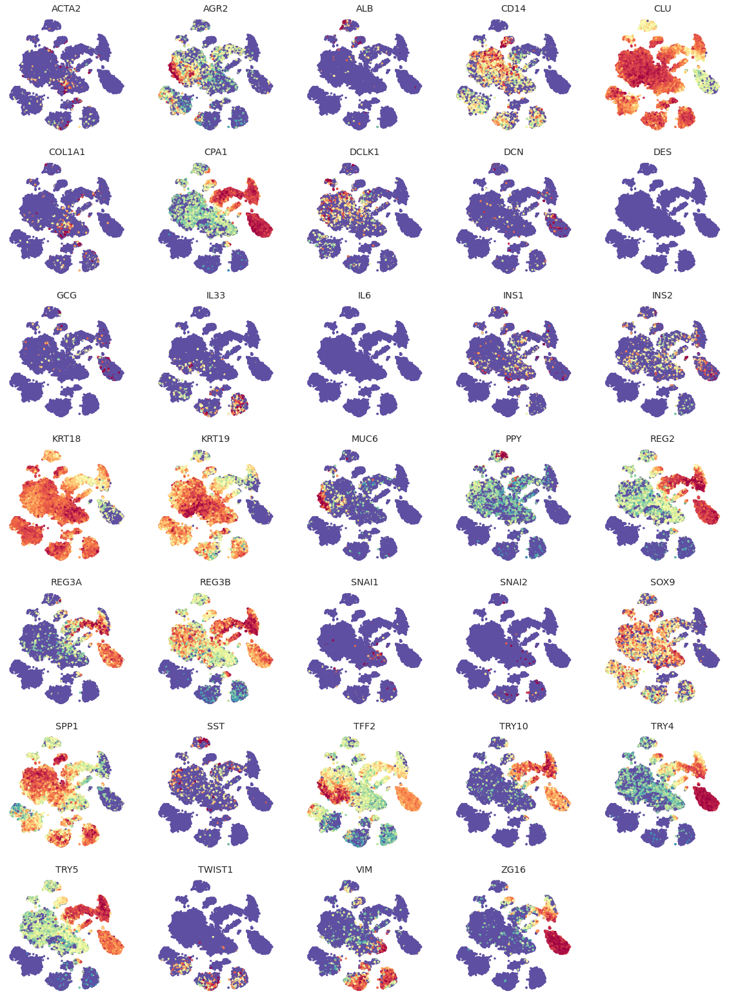

In [103]:
gene_plot(sc.tsne_log, sc.data_normalized, sc.markers)

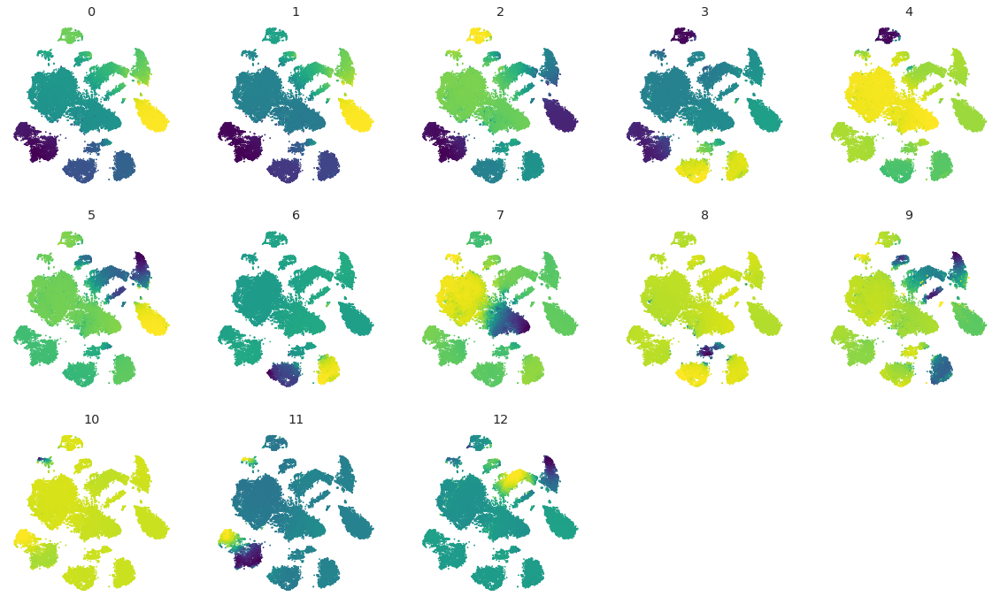

In [104]:
gene_plot(sc.tsne_log, sc.dm_res_log['EigenVectors'], range(sc.no_eigs_log),s=1,cmap='viridis')

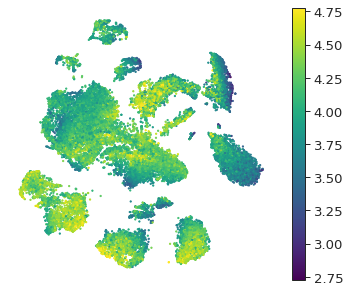

In [105]:
fig,ax=plt.subplots(figsize=(6,5))
color_tSNE(sc.tsne_log,np.log10(sc.lib_size),s=2)

In [106]:
barcode_mapping = pickle.load(open("old_barcode_mapping_dict.pickle",'rb'))

In [107]:
sc2 = load_sc("NewFiltering_ProgressionSet_Filtered_noV3_no184_Analysis4.pickle")

good_cells = ["{}_{}".format(sc2.cell_ids[cell],sc2.sample_ids[cell]) for cell in range(sc2.data.shape[0])]
our_cells = ["{}_{}".format(sc.cell_ids[cell],sc.sample_ids[cell]) for cell in range(sc.data.shape[0])]

good_cells_mapped = []
for bc in good_cells:
    try:
        good_cells_mapped.append(barcode_mapping[bc])
    except:
        if "_".join(bc.split("_")[1:]) in ['DACD511_Kate_plus','DACD550_kate_plus']:
            good_cells_mapped.append(bc)
        else:
            good_cells_mapped.append("Not Included")
        

In [108]:
new_communities,new_colors = [],[]
for cell in our_cells:
    try:
        cluster = sc2.communities[good_cells_mapped.index(cell)]
        new_communities.append(cluster)
        new_colors.append(sc.palette[cluster])
    except:
        new_communities.append(100)
        new_colors.append("#9796a3")

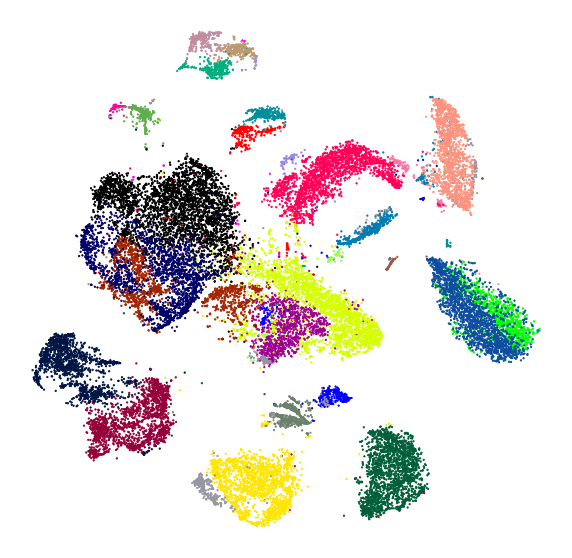

In [109]:
fig,ax = plt.subplots(figsize=(10,10))
ax.scatter(sc.tsne_log[:,0],sc.tsne_log[:,1],c=new_colors,s=2)
ax.set_axis_off()

In [110]:
#tsne_save = sc.tsne_log.copy()
ordering_ = np.random.choice(sc.data.shape[0],size=sc.data.shape[0],replace=False)
tsne = bhtsne.tsne(sc.pc_log[:,:sc.npca_log][ordering_,:],perplexity=150,theta=.5)

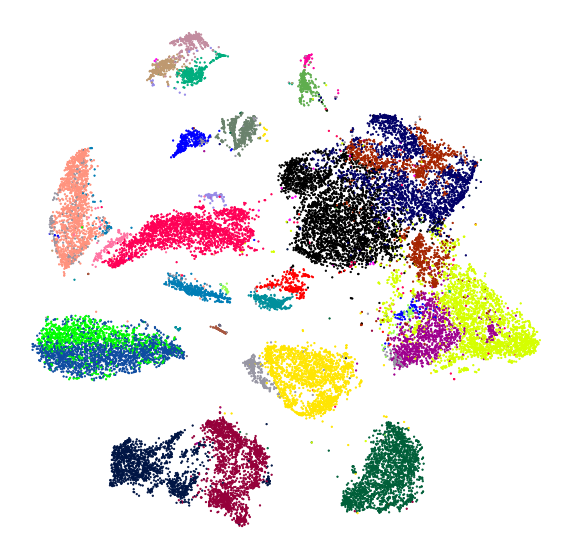

In [111]:
fig,ax = plt.subplots(figsize=(10,10))
ax.scatter(tsne[:,0],tsne[:,1],c=np.array(new_colors)[ordering_],s=2)
ax.set_axis_off()

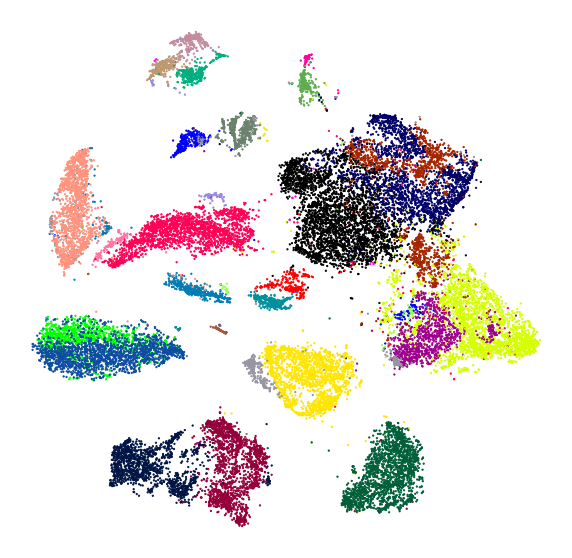

In [112]:
fig,ax = plt.subplots(figsize=(10,10))
ax.scatter(tsne[:,0][np.argsort(ordering_)],tsne[:,1][np.argsort(ordering_)],c=np.array(new_colors),s=2)
ax.set_axis_off()

In [113]:
sc.tsne_log = tsne[np.argsort(ordering_),:]

In [114]:
def save_sc(sc,file_path):
    sc.data_normalized = csr_matrix(sc.data_normalized.values)
    sc.data = csr_matrix(sc.data.values)
    sc.data_imputed=None
    
    max_bytes = 2**31 - 1

    ## write
    bytes_out = pickle.dumps(sc)
    with open(file_path, 'wb') as f_out:
        for idx in range(0, len(bytes_out), max_bytes):
            f_out.write(bytes_out[idx:idx+max_bytes])
            


def load_sc(file_path):
    
    max_bytes = 2**31 - 1

    bytes_in = bytearray(0)
    input_size = os.path.getsize(file_path)
    with open(file_path, 'rb') as f_in:
        for _ in range(0, input_size, max_bytes):
            bytes_in += f_in.read(max_bytes)
    sc = pickle.loads(bytes_in)
    
    sc.data = pd.DataFrame(sc.data.toarray(),columns=sc.genes,index=sc.cell_ids)
    sc.data_normalized = pd.DataFrame(sc.data_normalized.toarray(),columns=sc.genes,index=sc.cell_ids)
    
    return sc   

In [115]:
sc.samples = None
sc.communities_orig = new_communities.copy()
#sc.filter_cells_new = filter_cells
save_sc(sc,"FullProgression-March2021_NewFilt-OrigGenes_v3.pickle")

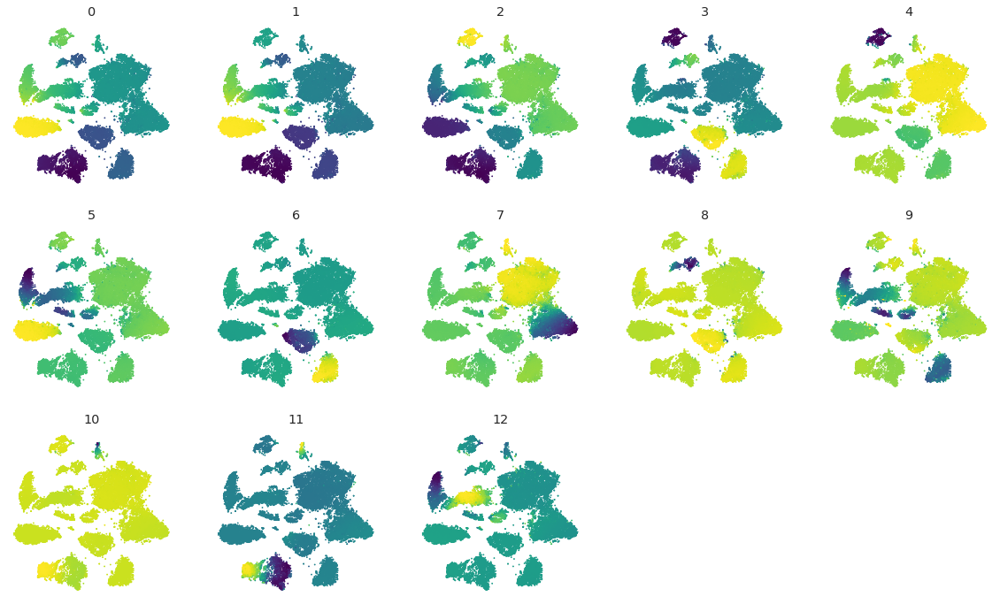

In [116]:
gene_plot(sc.tsne_log, sc.dm_res_log['EigenVectors'], range(sc.no_eigs_log),s=1,cmap='viridis')